In [127]:
import pandas as pd
import datetime, time
import numpy as np

In [128]:
import matplotlib.pyplot as plt

In [129]:
df=pd.read_hdf("all_wind.h5")

## remove unnecessary columns 

In [130]:
for nam in df.columns:
    if len(df[nam].unique()) == 1 :
        print(nam)
        df.drop([nam],axis=1,inplace=True)

trajectory__boutFrame
trajectory__compensation
trajectory__gain
trajectory__impose
trajectory__imposeHeading
trajectory__imposeResponse
trajectory__imposeResponseHeading
trajectory__imposeResponseSmooth
trajectory__key
trajectory__o1Pos_x
trajectory__o1Pos_y
trajectory__o1Pos_z
trajectory__o2Pos_x
trajectory__o2Pos_y
trajectory__o2Pos_z
trajectory__pOri_y
trajectory__pOri_z
trajectory__packetDuration
trajectory__packetFrequency
trajectory__pfStimState
trajectory__quadrant
trajectory__speedControl
trajectory__valve1
trajectory__valve2
trajectory__valve3


In [6]:
df.windPressure.unique()

array(['0.', '0.5', '1.', '1.5', '2.', '2.5', '3.', '3.5', '4.', '4.5',
       '4.8'], dtype=object)

In [7]:
df.trajectory__case.unique()
tsl = df.timeStamp.unique()

['1.']
['1.']
['1.']
['1.']


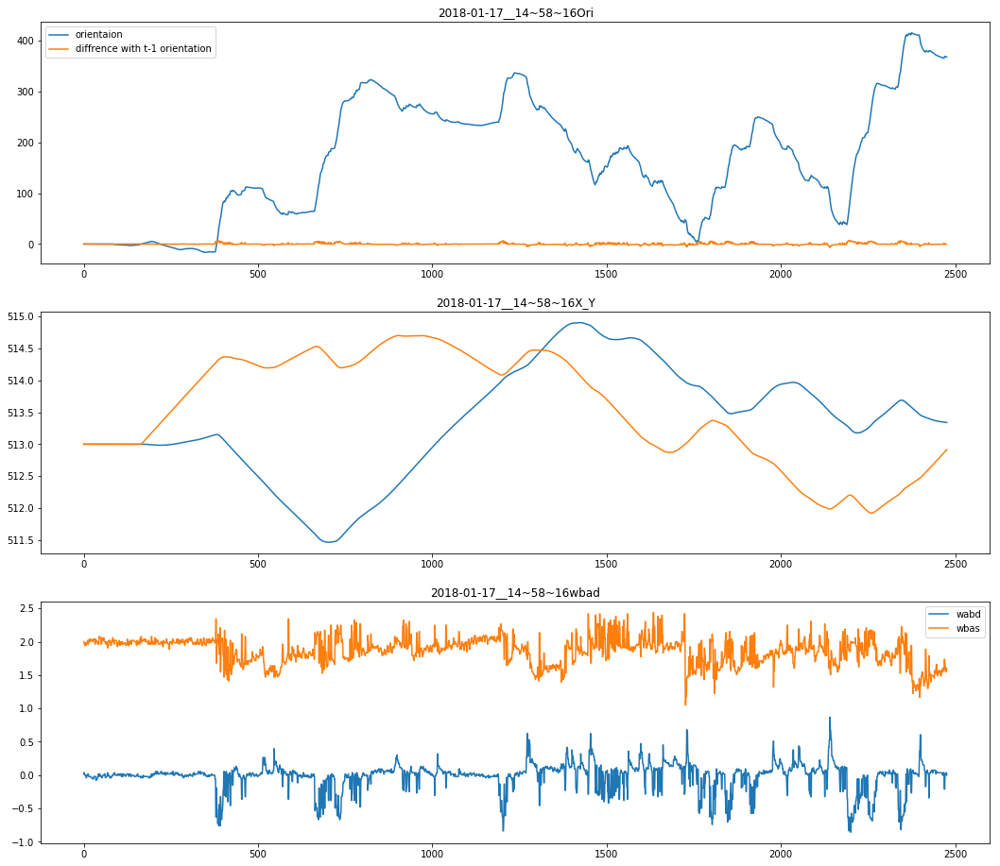

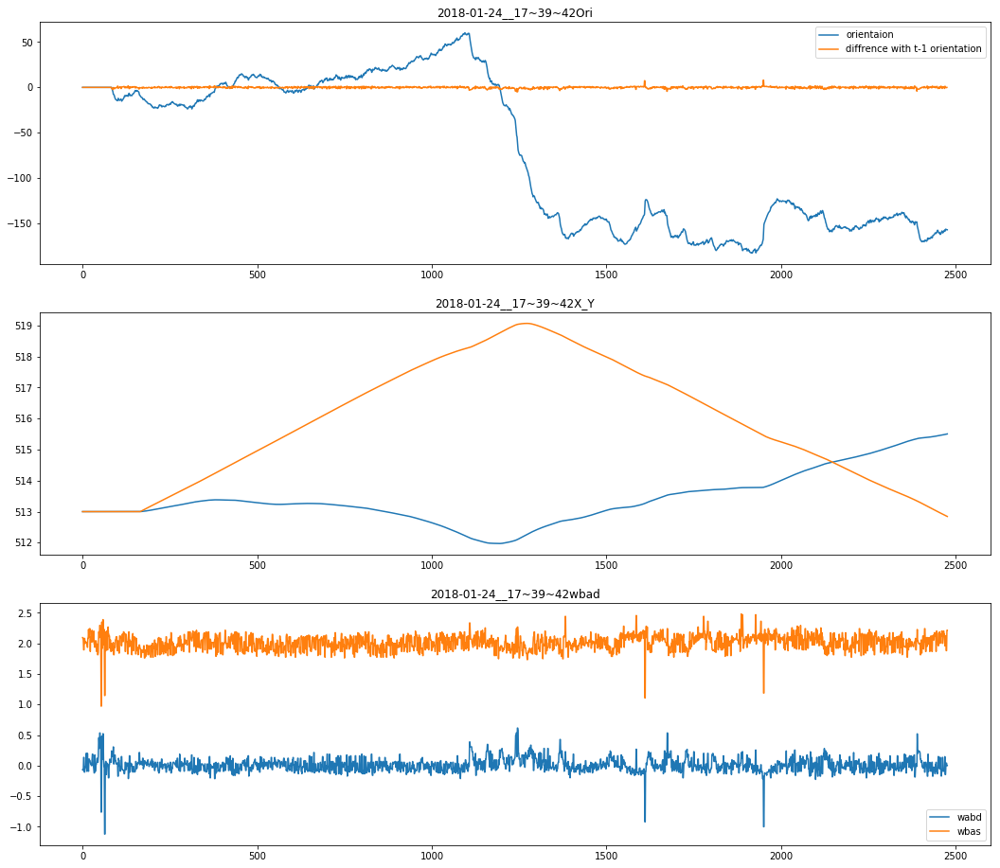

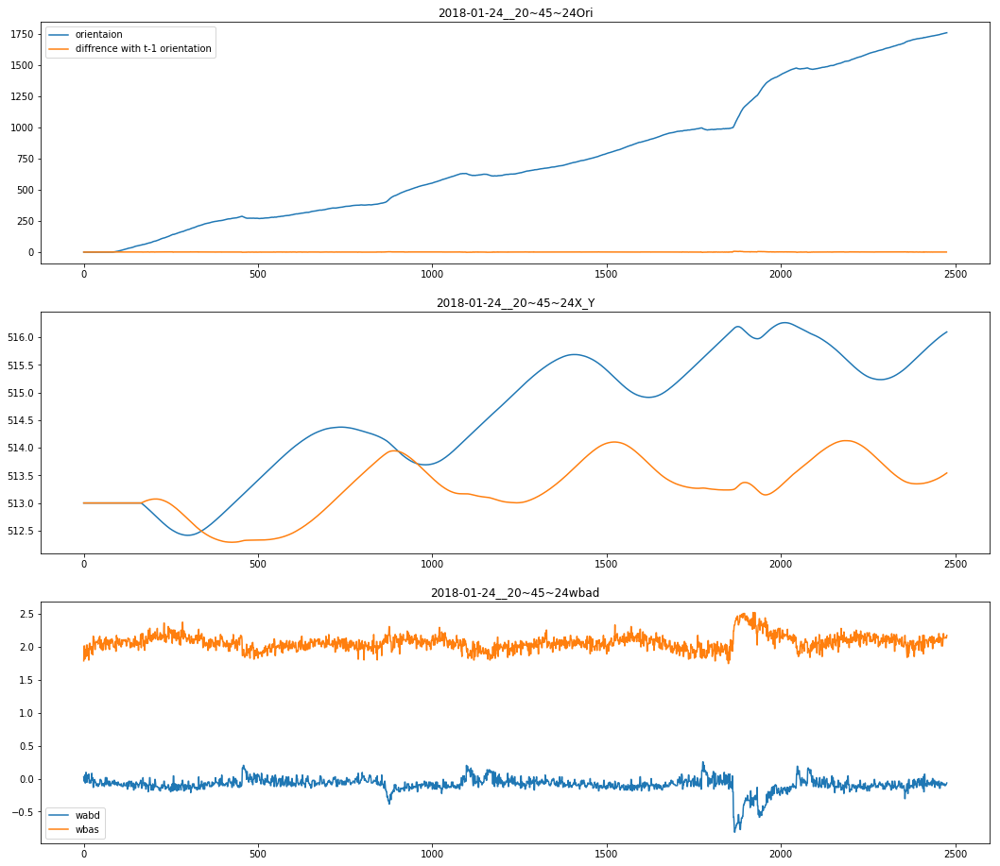

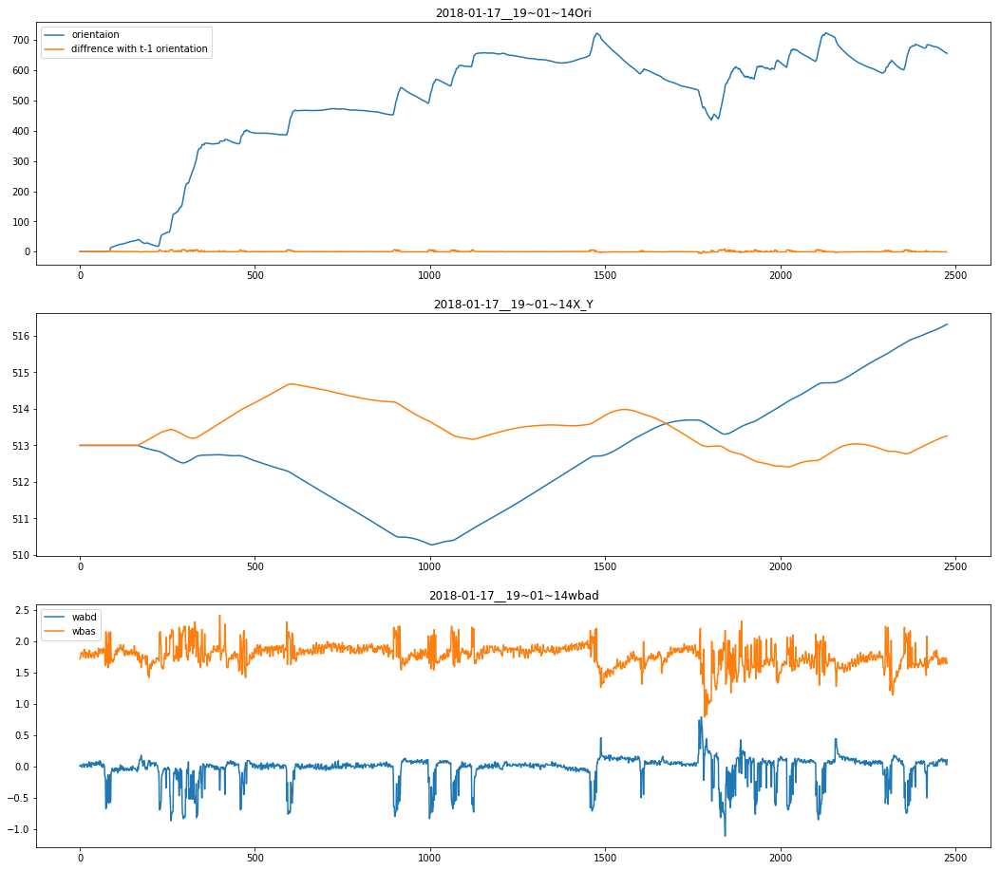

In [26]:
#def plot_orientations(wind_speed,case):
case = 1
for ts in tsl:
    df2 = df[(df.timeStamp==ts)&(df.windPressure=='1.')&(df.visual =="grassSky" ) & (df.trajectory__runNum==1)&(df.trajectory__trial==3.0) & df.trajectory__case == case ]
    lst=df2.windPressure.unique()
    if(len(lst)>0):
        print(df2.windPressure.unique())
        plt.figure(figsize=(18, 16))
        plt.subplot(311)
        plt.plot(df2.trajectory__pOri_x.values,label="orientaion")
        plt.plot(np.diff(df2.trajectory__pOri_x.values),label="diffrence with t-1 orientation")
        #plt.plot(df2.trajectory__wbad.values,label="wabd")
        plt.title(ts+"Ori")
        plt.legend()
        plt.subplot(312)
        plt.plot(df2.trajectory__pPos_x.values,label="x")
        plt.plot(df2.trajectory__pPos_y.values,label="y")
        plt.title(ts+"X_Y")
        plt.subplot(313)
        plt.plot(df2.trajectory__wbad.values,label="wabd")
        plt.plot(df2.trajectory__wbas.values,label="wbas")
        plt.title(ts+"wing beat amplitude")
        plt.legend()
        plt.title(ts+"wbad")

/home/lsr/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


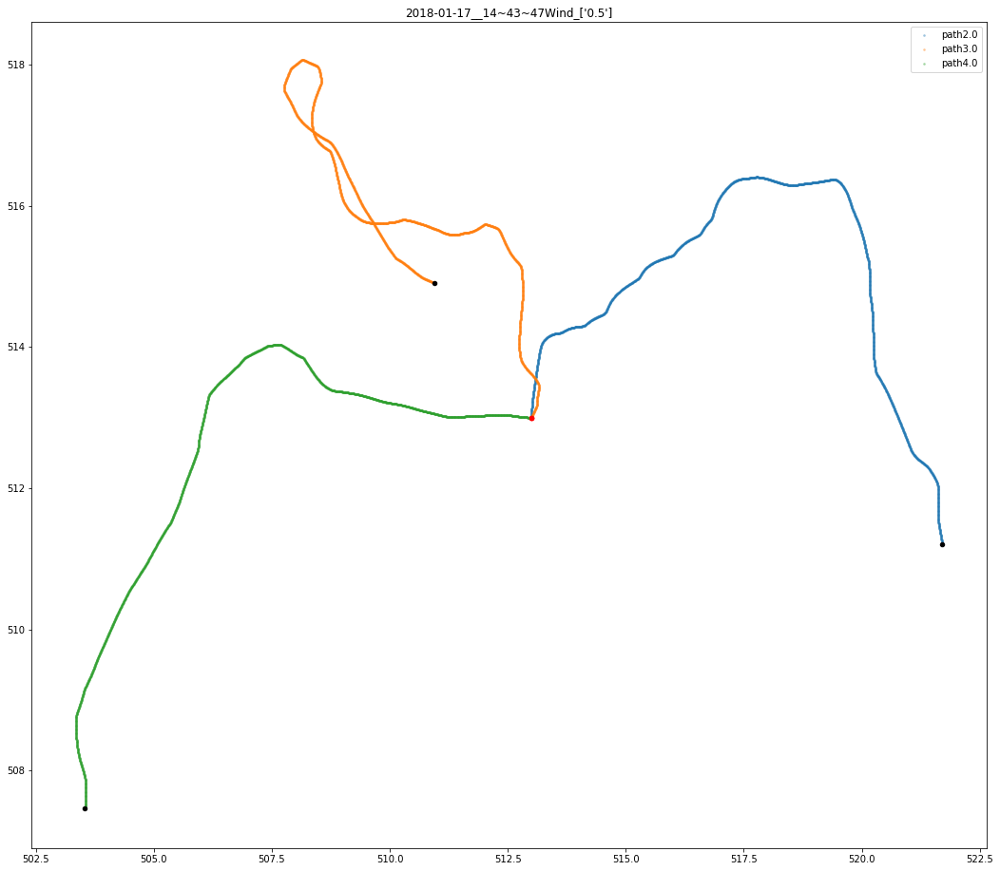

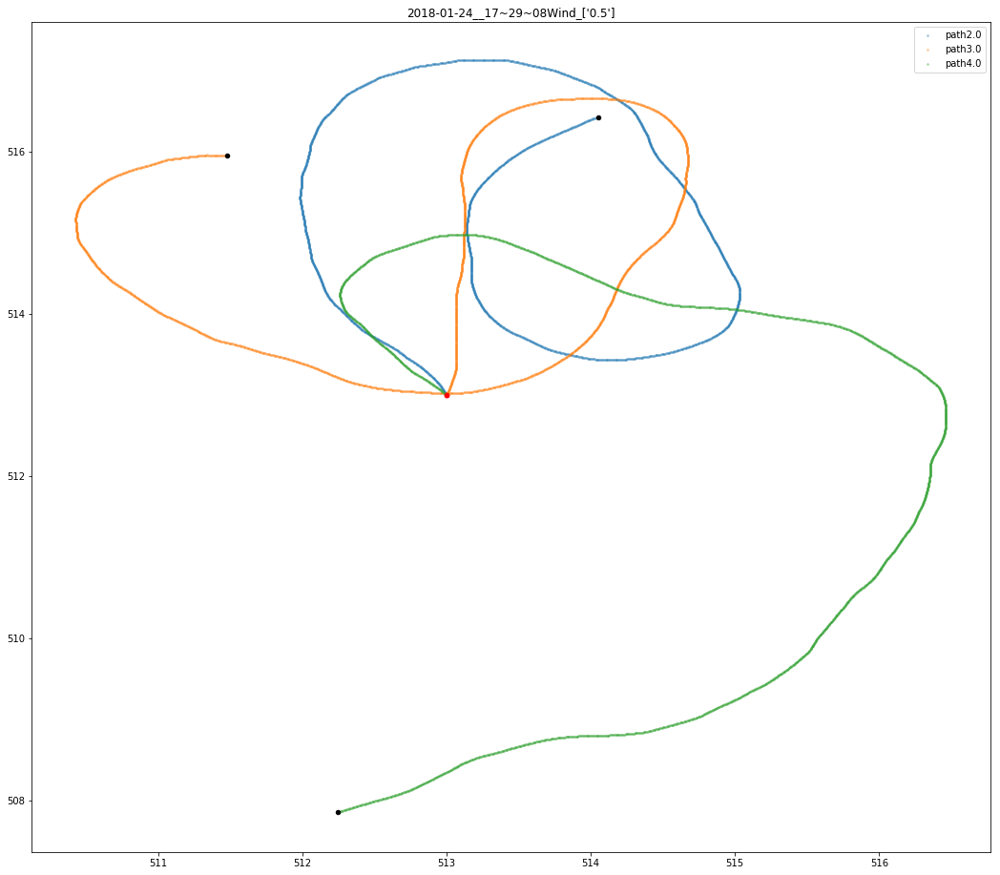

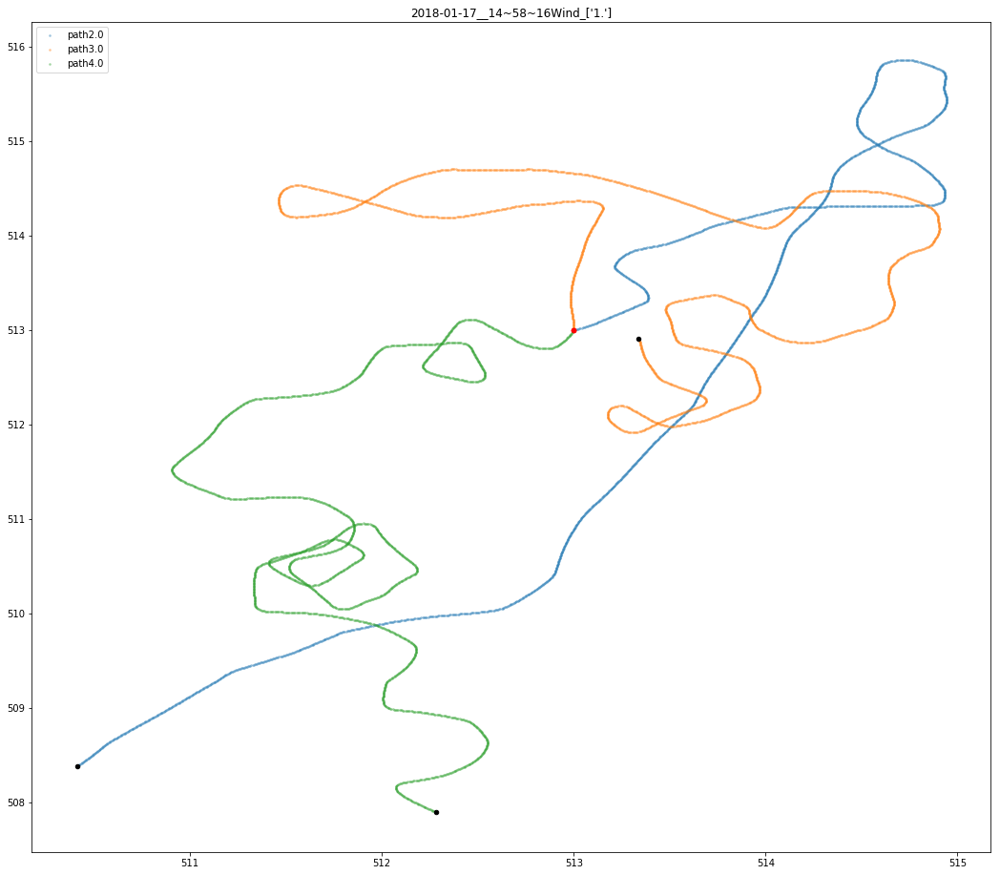

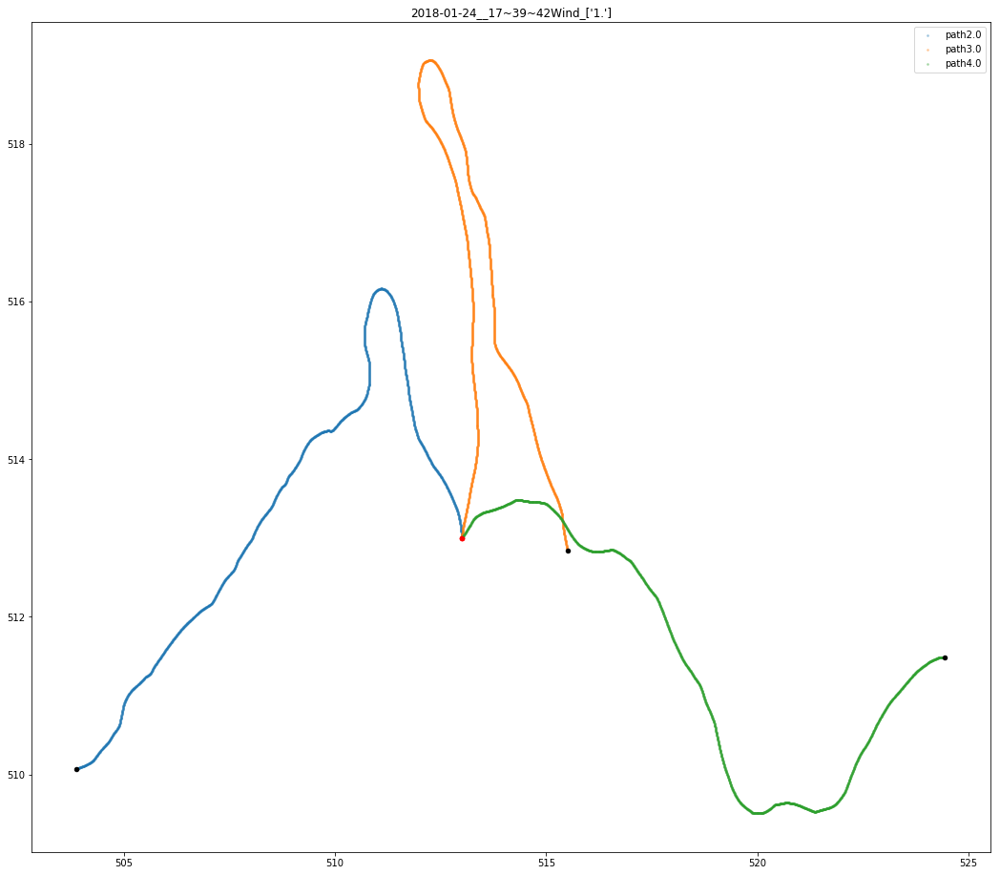

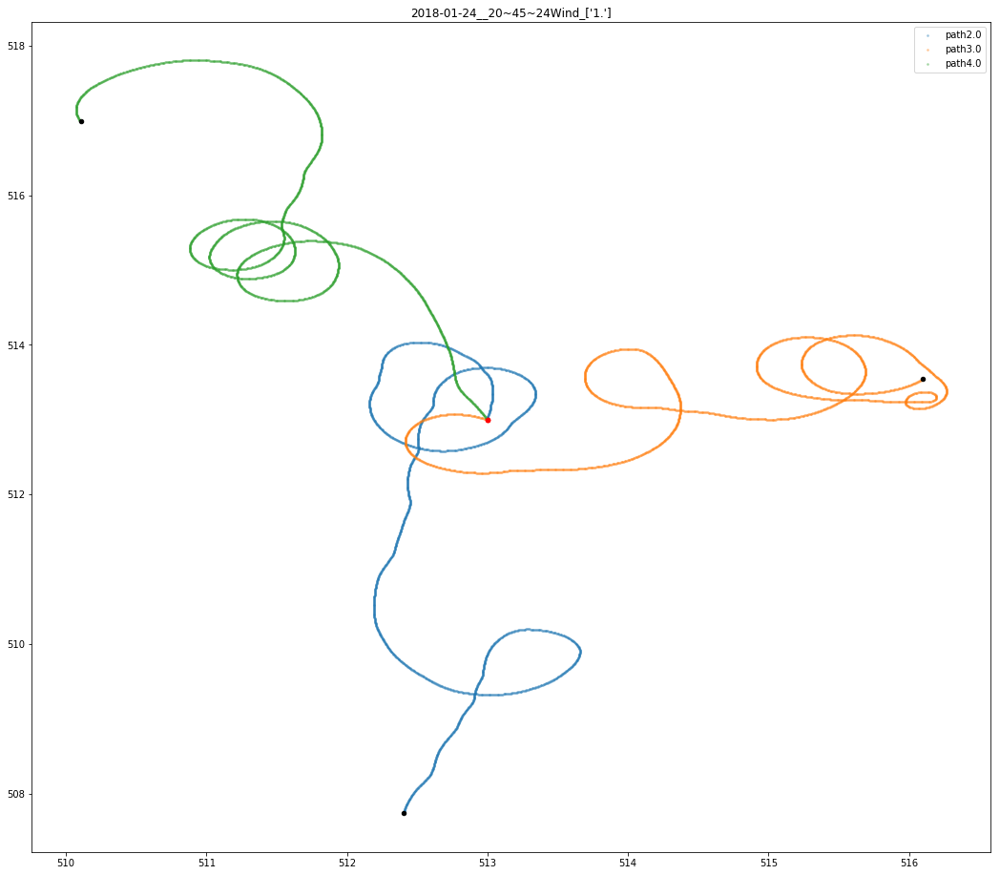

...

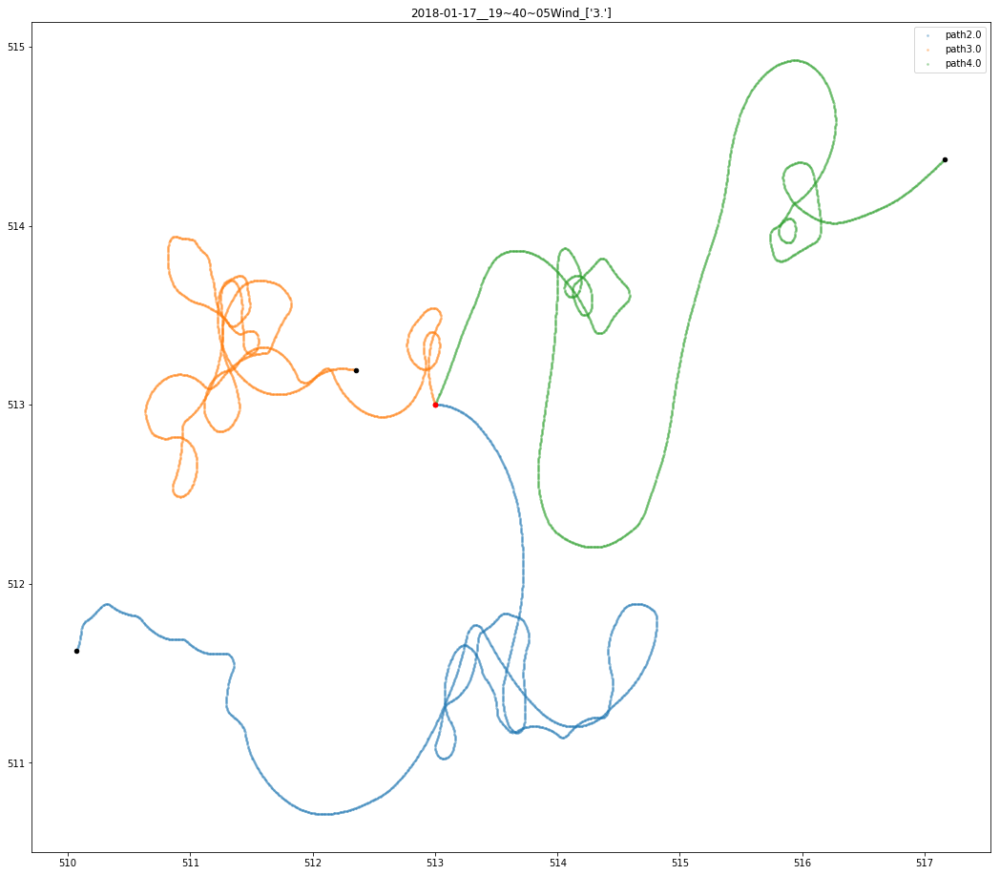

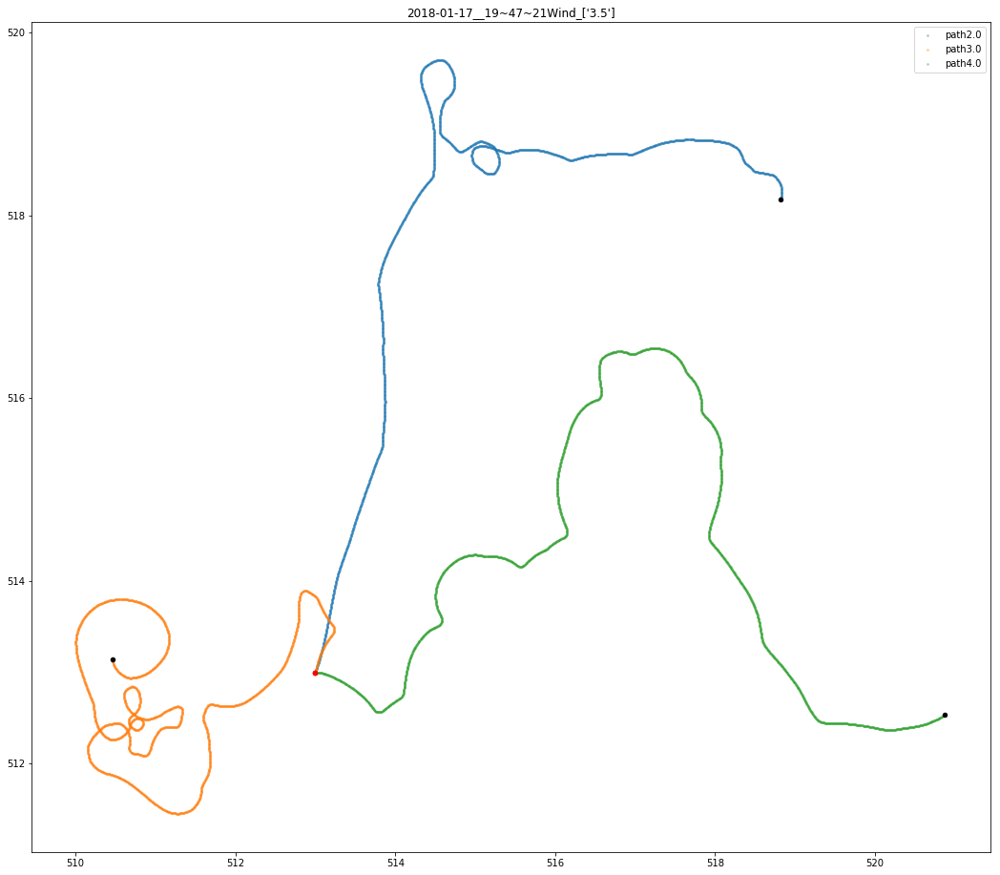

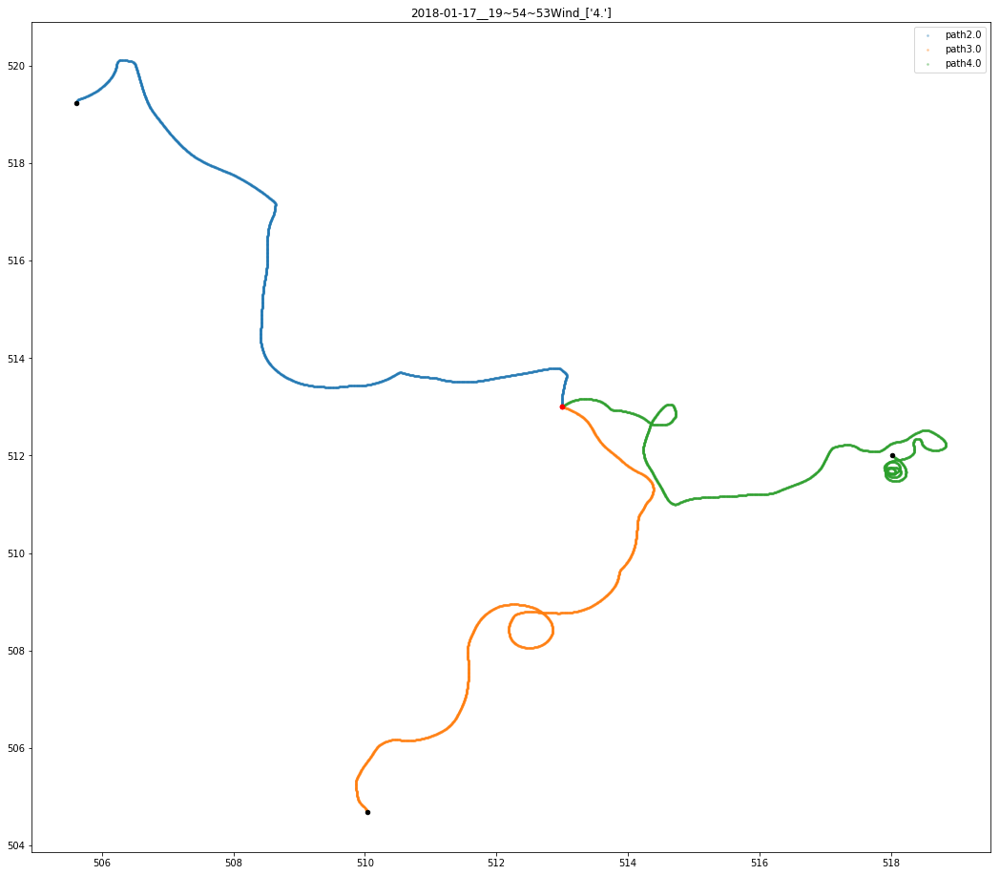

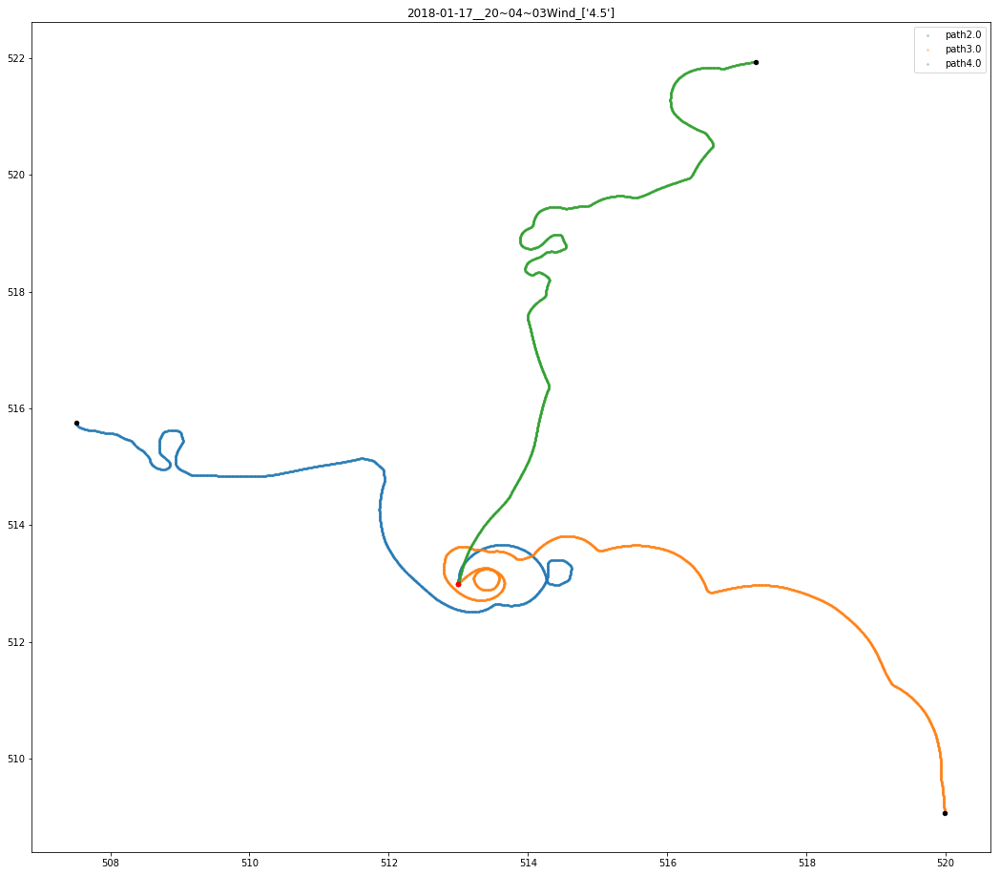

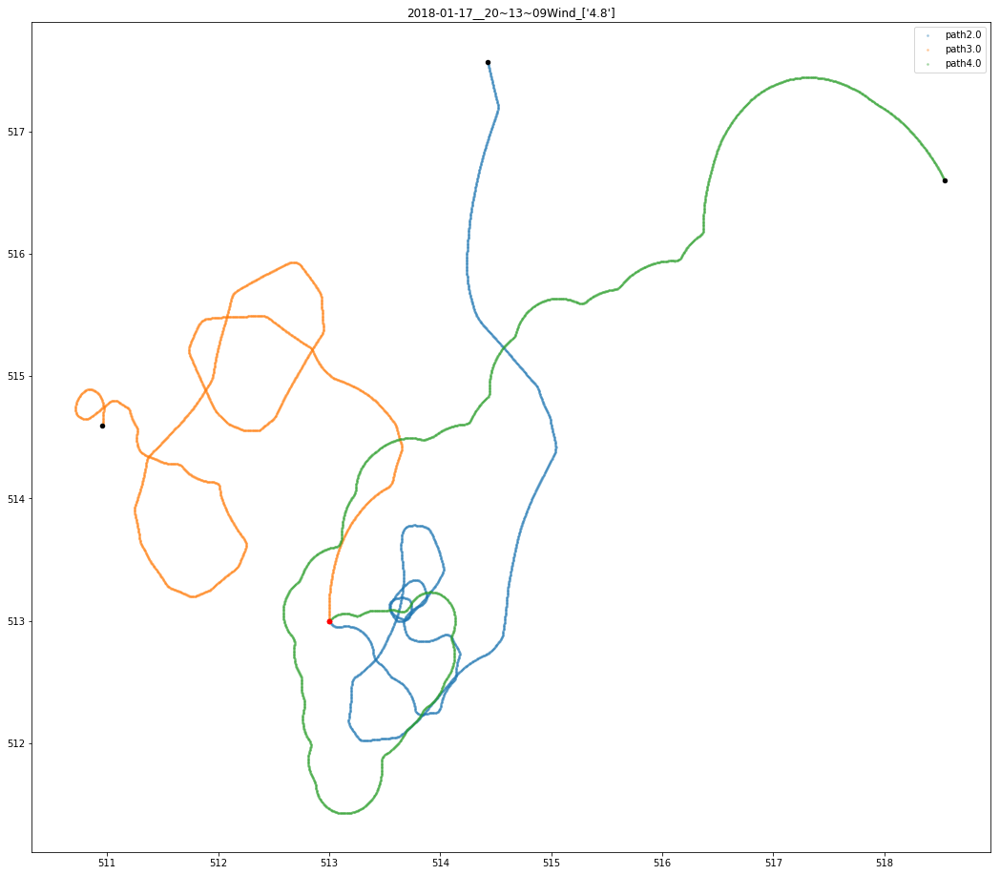

In [118]:
#def plot_orientations(wind_speed,case):
case = 1
dfs=[]
for ts in tsl:
    df2 = df[(df.timeStamp==ts)&(df.windPressure.astype(float)>0)&(df.visual =="grassSky" ) & (df.trajectory__runNum==1) & df.trajectory__case == case ]
    lst=df2.windPressure.unique()
    if(len(lst)>0):
        #print(ts)
        dfs.append(df2)
        #print(df2.windPressure.unique())
        plt.figure(figsize=(18, 16))
        trials=df2.trajectory__trial.unique()
        for trail in trials:
            df3= df2[df2.trajectory__trial == trail]
            plt.scatter(df3.trajectory__pPos_x,df3.trajectory__pPos_y,s=3,alpha=0.3,label="path"+str(trail))
            plt.scatter(df3.trajectory__pPos_x[0],df3.trajectory__pPos_y[0],s=20,c="red")
            #print(df3.trajectory__pPos_x[df3.shape[0]-3],df3.trajectory__pPos_y[df3.shape[0]-3])
            plt.scatter(df3.trajectory__pPos_x[df3.shape[0]-1],df3.trajectory__pPos_y[df3.shape[0]-1],s=20,c="black")
            #plt.xlim(500,526)
            #plt.ylim(500,526)    
        #plt.plot(np.diff(df2.trajectory__pOri_x.values),label="diffrence with t-1 orientation")
        plt.title(ts+"Wind_"+str(lst))
        plt.legend()

In [19]:
angl=np.arctan(df.trajectory__pPos_y.values/df.trajectory__pPos_x.values)
r=np.sqrt(df.trajectory__pPos_x.values**2 + df.trajectory__pPos_y.values**2)
df["angl"] = pd.Series(angl,df.index)
df["r"]=pd.Series(r,df.index)

In [9]:
def polar(x, y):
    r = np.sqrt(x ** 2 + y ** 2)
    if y == 0:
        theta = 180 if x < 0 else 0
    elif x == 0:
        theta = 90 if y > 0 else 270
    elif x < 0 and y < 0: #third qudrant
        theta = np.degrees(np.arctan(y / x))
        theta = 180+theta
    elif x>0 and y<0: #4th qudrant
        theta = np.degrees(np.arctan((-1.0*y) / x))
        theta = 270+theta
    elif x<0 and y >0 : #2nd quadrant
        theta = np.degrees(np.arctan(y / (-1.0*x)))
        theta = 90 + theta
    else:
        theta = np.degrees(np.arctan(float(y) / x))
    return r, theta


In [15]:
r=[]
theta=[]
for x,y in zip(df.trajectory__pPos_x.values,df.trajectory__pPos_y.values):
    rad,ang=polar(x-513,y-513)
    r.append(rad)
    theta.append(ang)

In [16]:
df["r"]=pd.Series(r,df.index)
df["theta"]= pd.Series(theta,df.index)

/home/lsr/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


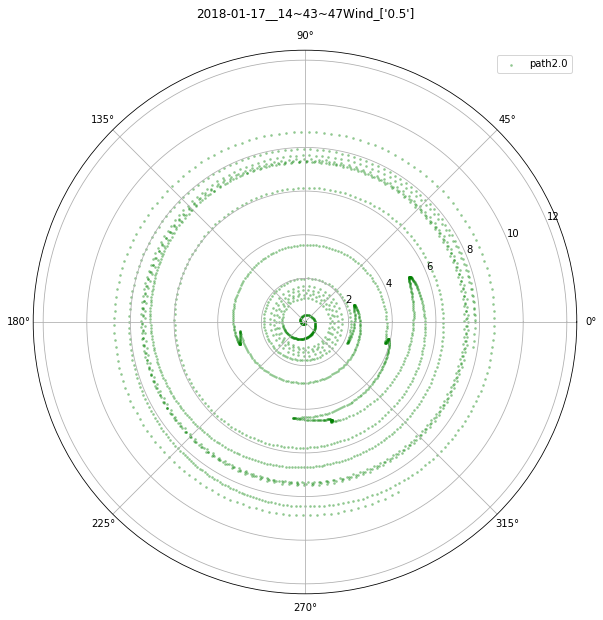

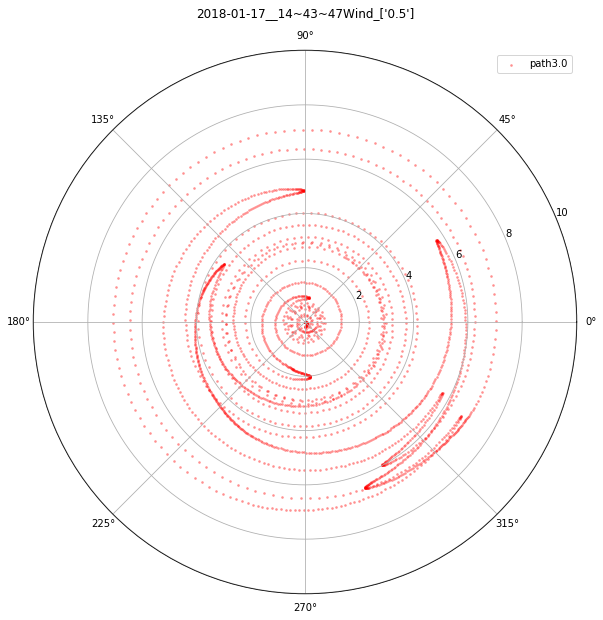

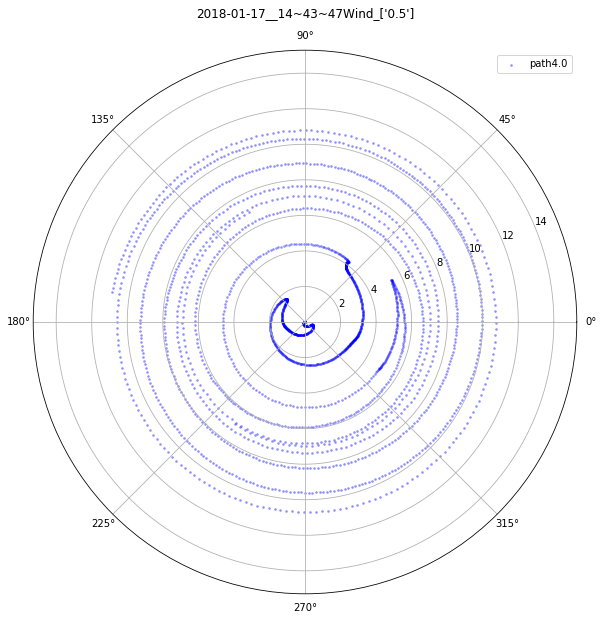

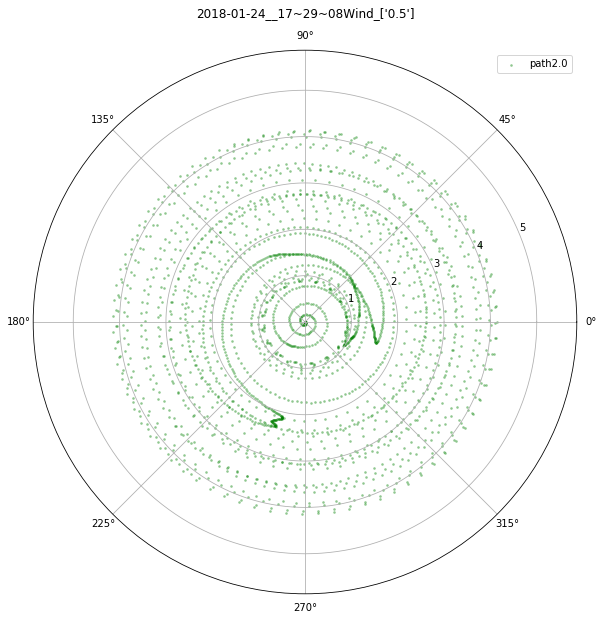

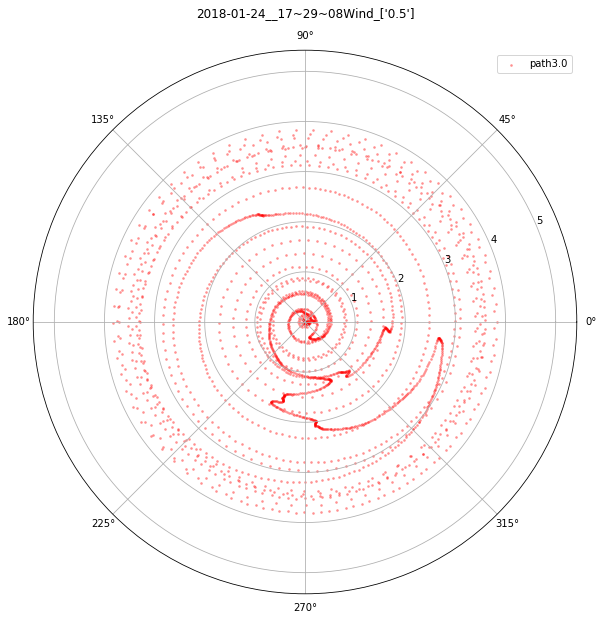

...

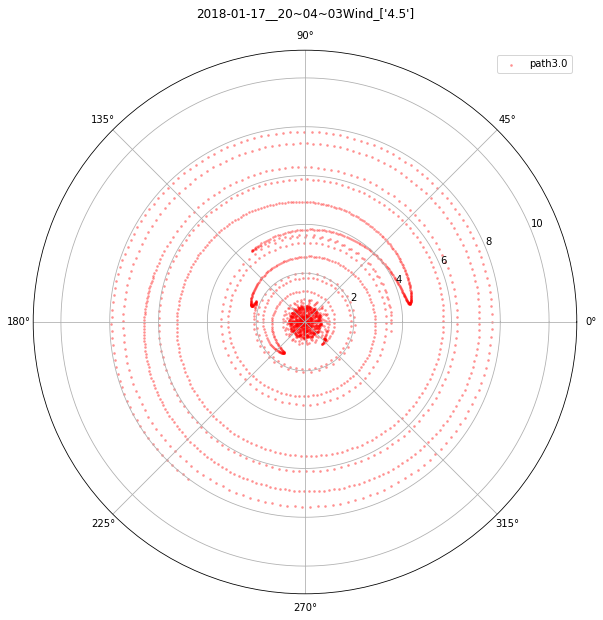

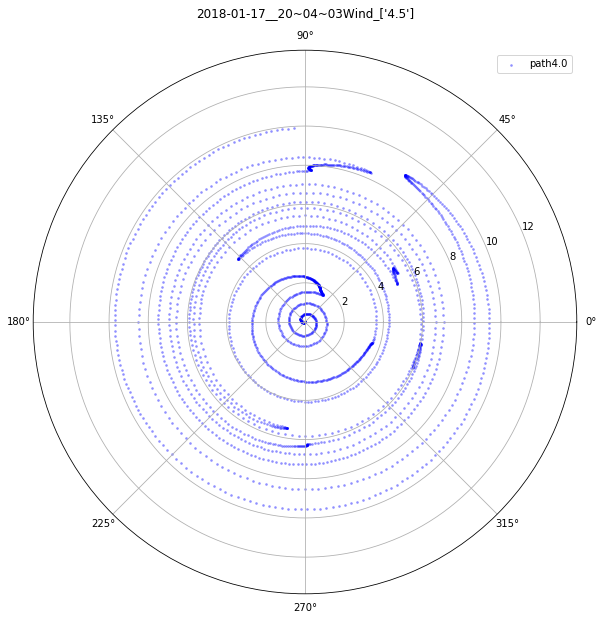

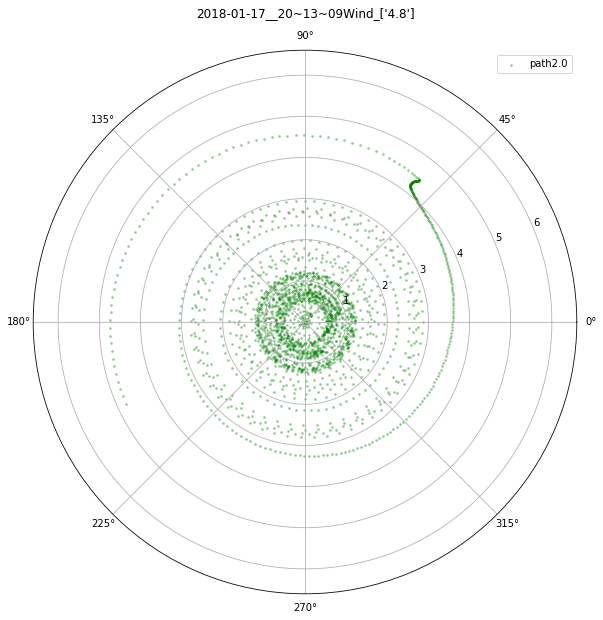

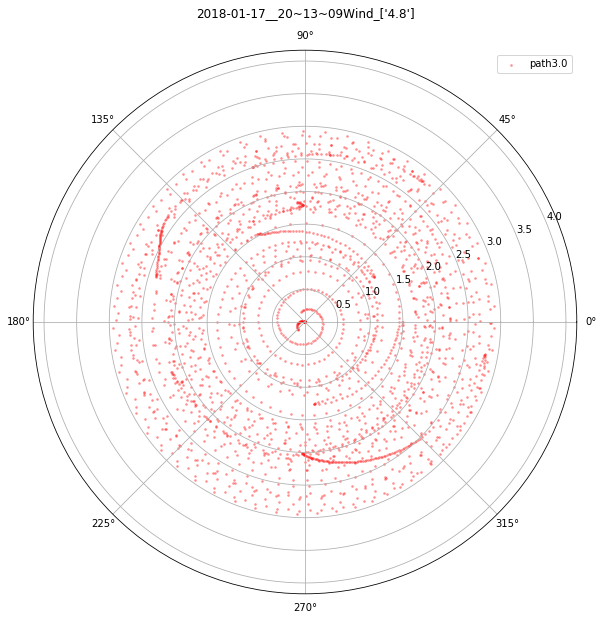

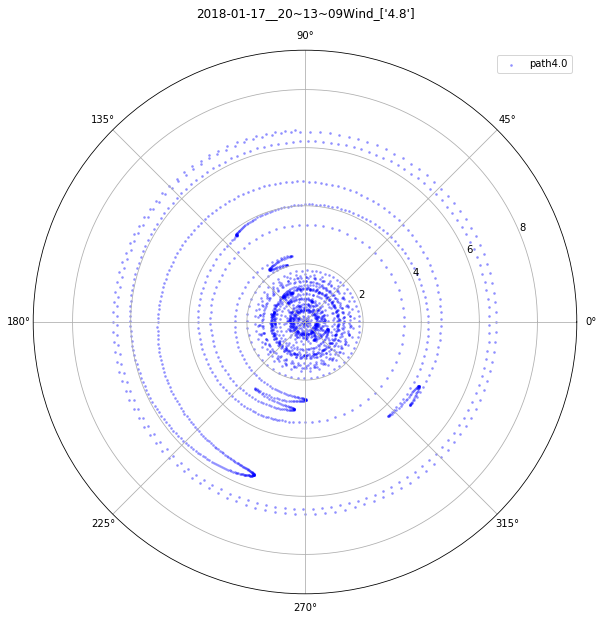

In [17]:
#def plot_orientations(wind_speed,case):
case = 1
dfs=[]
clrs=['g','r','b']
for ts in tsl:
    df2 = df[(df.timeStamp==ts)&(df.windPressure.astype(float)>0)&(df.visual =="grassSky" ) & (df.trajectory__runNum==1) & df.trajectory__case == case ]
    lst=df2.windPressure.unique()
    if(len(lst)>0):
        #print(ts)
        dfs.append(df2)
        #print(df2.windPressure.unique())
        trials=df2.trajectory__trial.unique()
#         plt.figure(figsize=(12, 10))
        for i,trail in enumerate(trials):
            plt.figure(figsize=(12, 10))
            df3= df2[df2.trajectory__trial == trail]
            ax=plt.subplot(111,projection='polar')
            ax.scatter(df3.theta, df3.r,c=clrs[i],label="path"+str(trail),s=3,alpha=0.3)
            #ax.plot(df3.theta, df3.r,clrs[i],label="path"+str(trail))
            plt.title(ts+"Wind_"+str(lst))
            plt.legend()
#             ax.set_rmax(750)
#             ax.set_rmin(700)
#             ax.set_thetamax(90)
#             ax.set_thetamin(0)
#             print(df3.trajectory__pPos_x[df3.shape[0]-3],df3.trajectory__pPos_y[df3.shape[0]-3])
            #plt.scatter(df3.trajectory__pPos_x[df3.shape[0]-1],df3.trajectory__pPos_y[df3.shape[0]-1],s=20,c="black")
            #plt.xlim(500,526)
            #plt.ylim(500,526)    
        #plt.plot(np.diff(df2.trajectory__pOri_x.values),label="diffrence with t-1 orientation")
        #plt.title(ts+"Wind_"+str(lst))
        #plt.legend()

In [51]:
df.trajectory__case.unique()

array([0., 1., 2., 3.])

/home/lsr/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


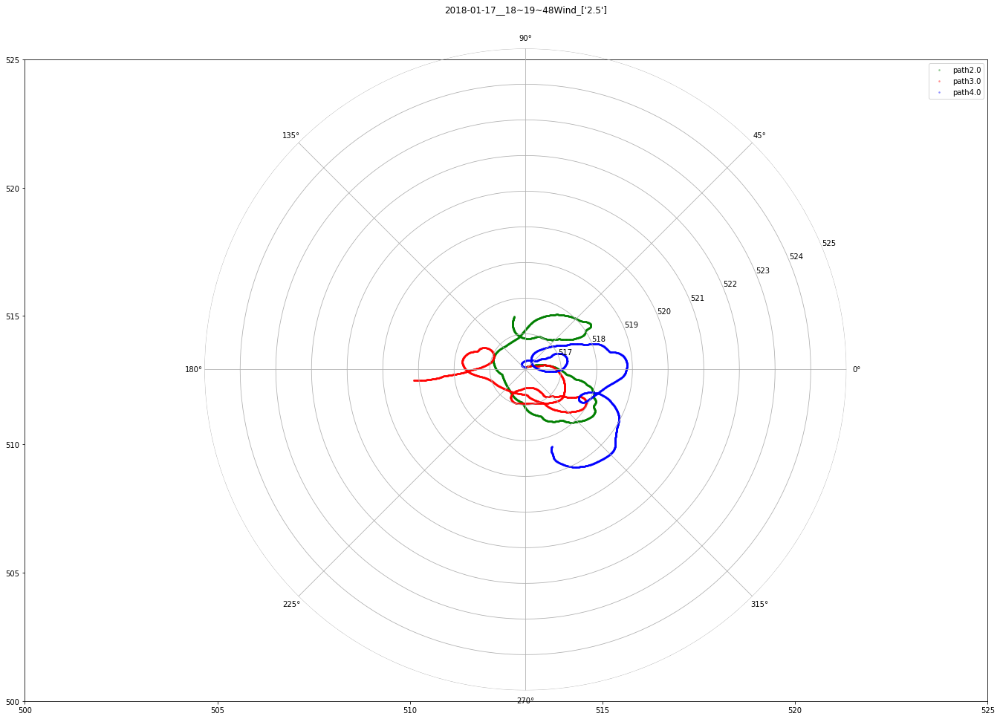

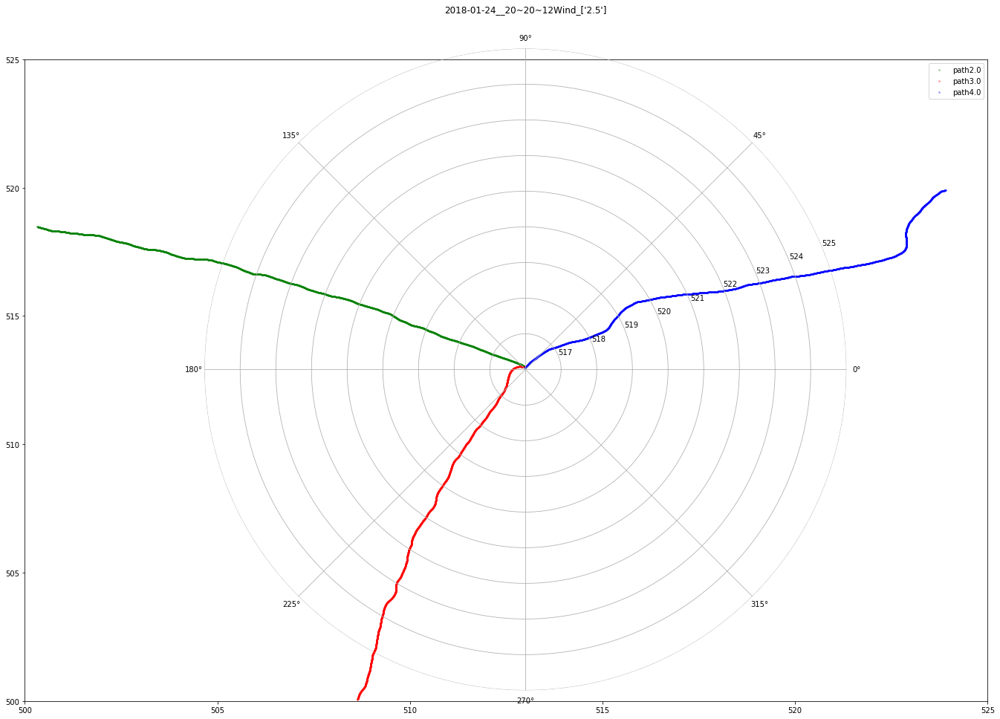

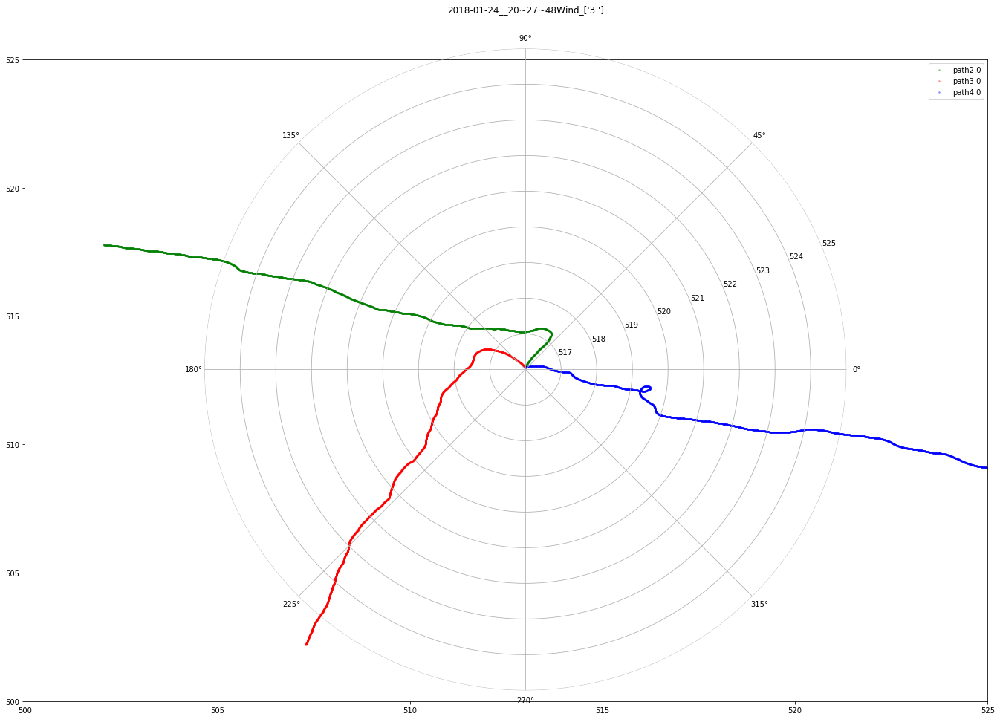

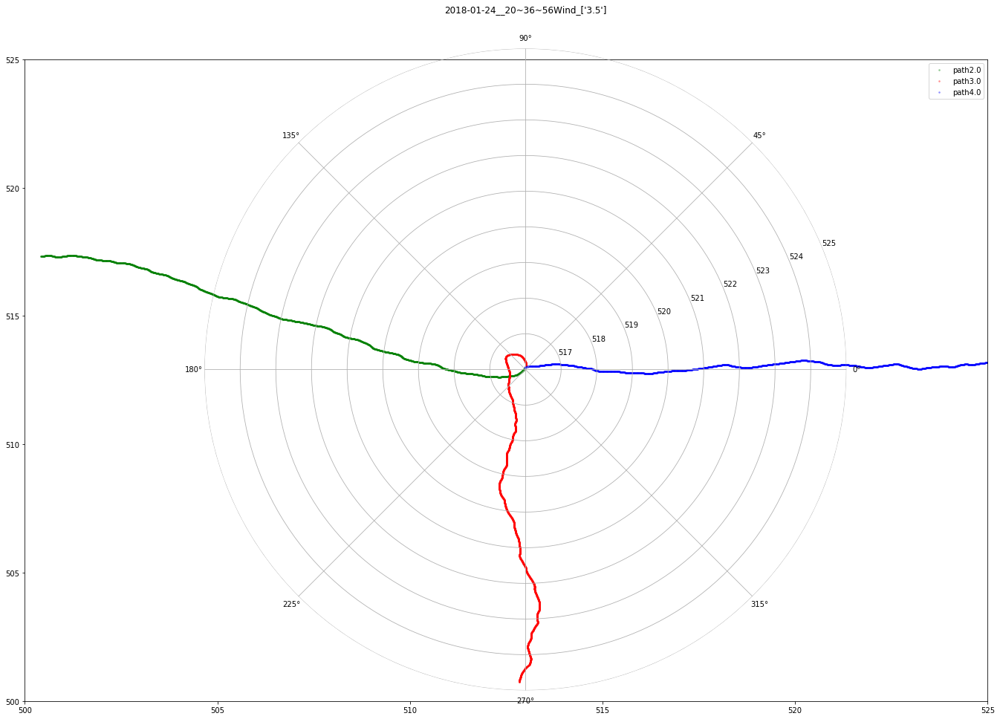

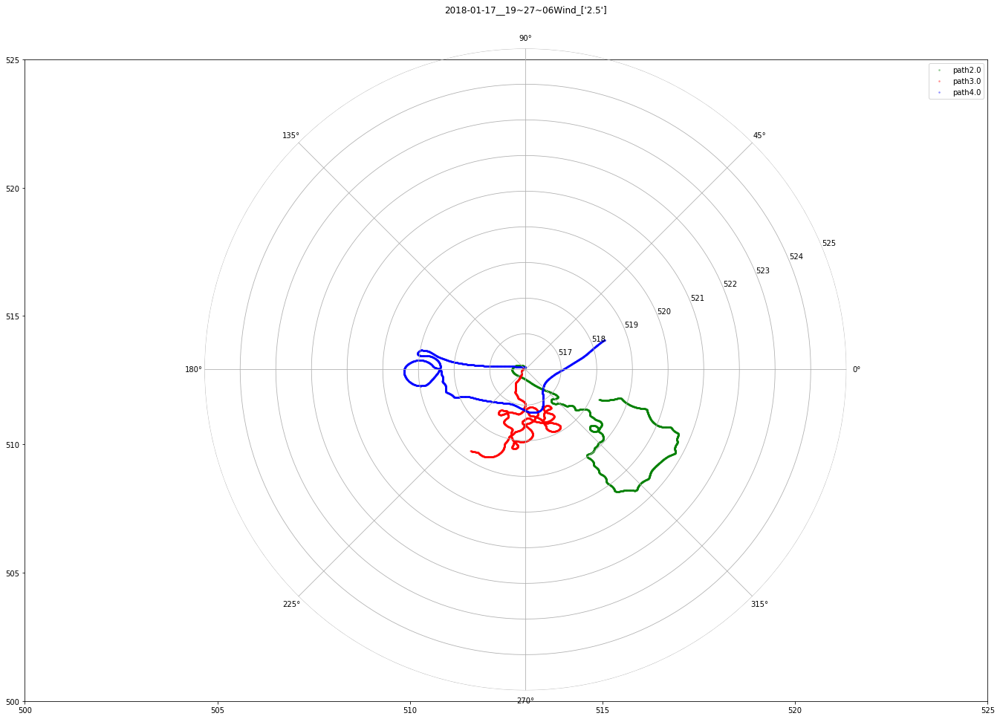

...

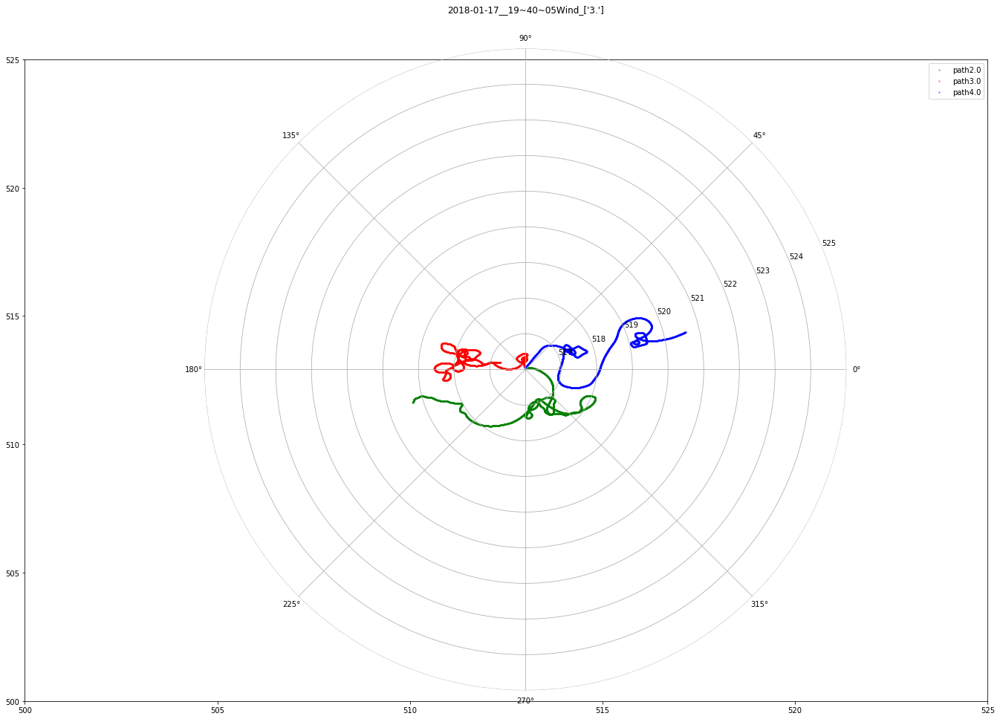

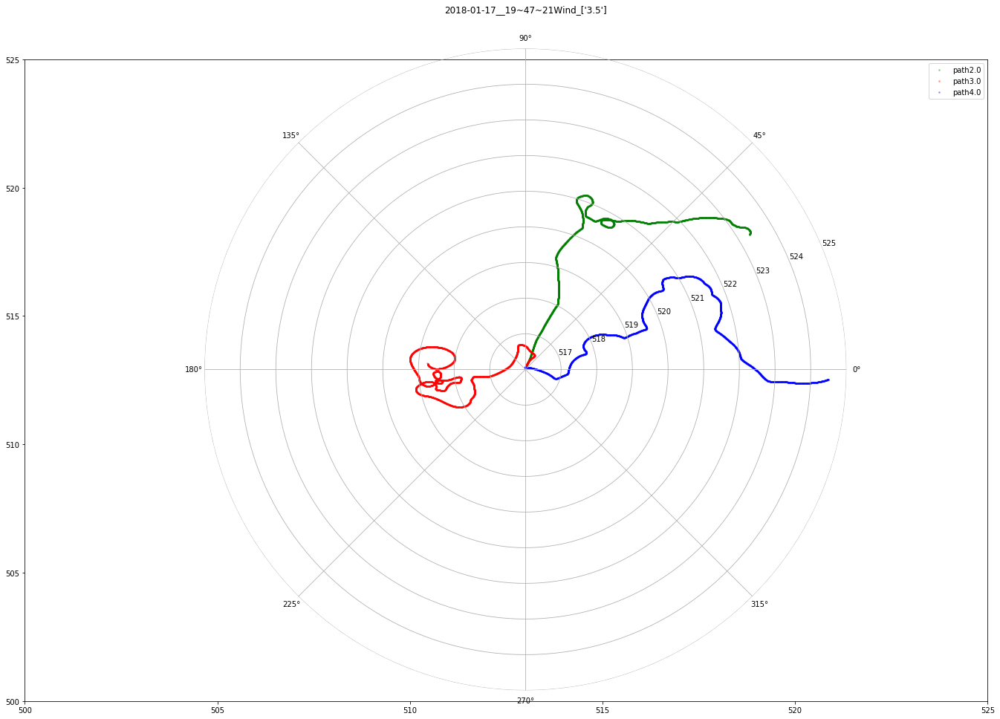

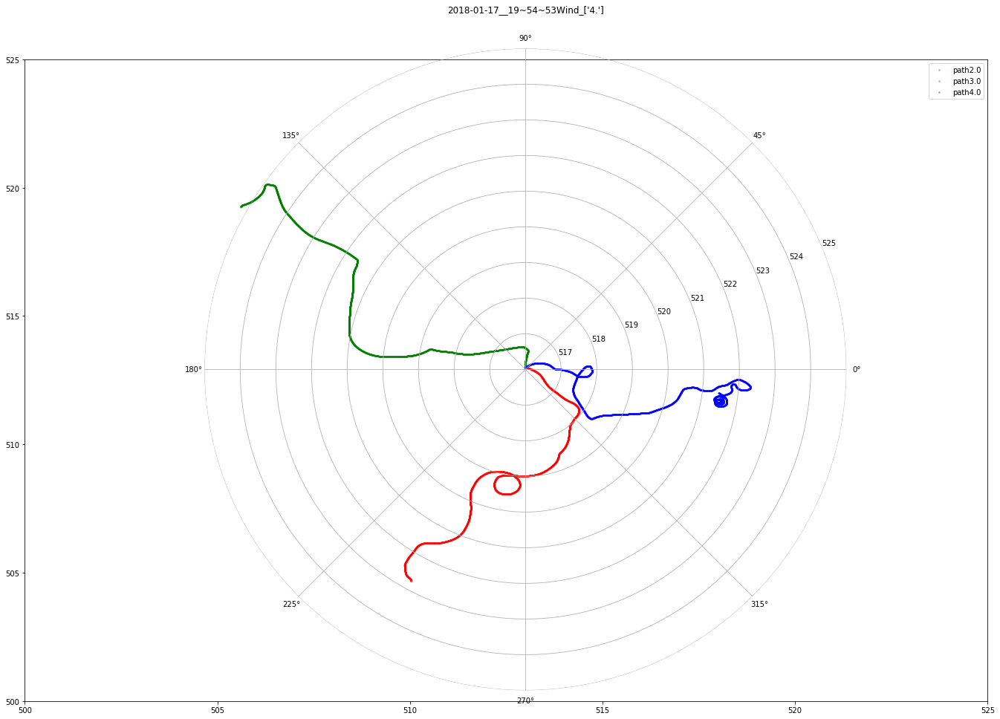

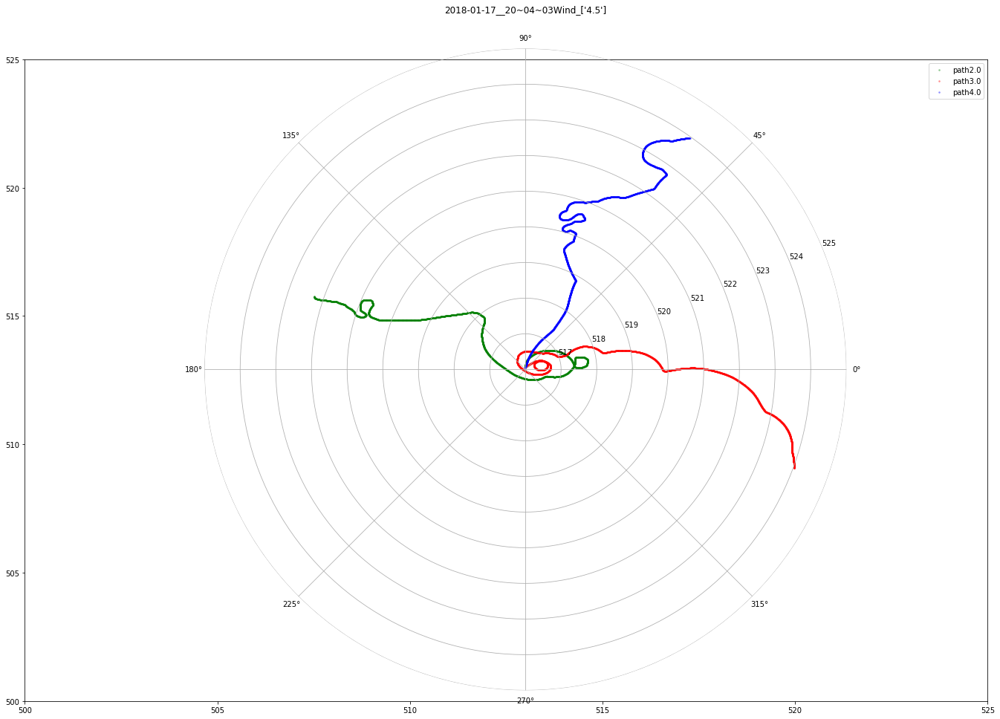

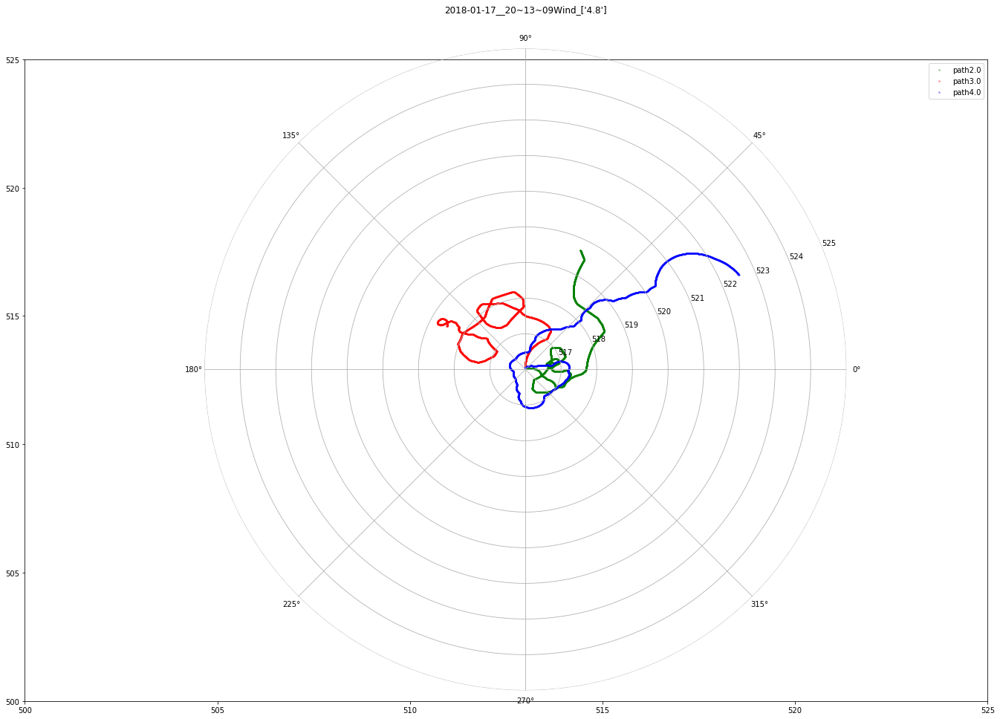

In [131]:
case = 1
dfs=[]
clrs=['g','r','b']
for ts in tsl:
    df2 = df[(df.timeStamp==ts)&(df.windPressure.astype(float)>2.0)&(df.visual =="grassSky" )&(df.trajectory__runNum ==1 )  & df.trajectory__case == case ]
    lst=df2.windPressure.unique()
    if(len(lst)>0):
        #print(ts)
        dfs.append(df2)
        #print(df2.windPressure.unique())
        trials=df2.trajectory__trial.unique()
        fig=plt.figure()
        for i,trail in enumerate(trials):
#             plt.figure(figsize=(12, 10))
            df3= df2[df2.trajectory__trial == trail]
            #ax=plt.subplot(111,projection='polar')
            ax_carthesian  = fig.add_axes([0.1,0.1,3,3])
            ax_polar = fig.add_axes([0.16,0.15,3,3], polar=True, frameon=False)
            ax_carthesian.scatter(df3.trajectory__pPos_x.values, df3.trajectory__pPos_y.values,c=clrs[i],label="path"+str(trail),s=3,alpha=0.3)
            plt.title(ts+"Wind_"+str(lst))
           # plt.legend()
            ax_polar.grid(True)
            #ax_polar.set_rmin(513)
            ax_carthesian.set_xlim(500,525)
            ax_carthesian.set_ylim(500,525)
            #ax_polar.axis((513,513))
            ax_polar.set_rmin(516)
            ax_polar.set_rmax(525)
            ax_carthesian.legend()
            #ax_polar.
            #plt.xlim(500,526)
            #ax_polar.set_rmax

In [39]:
+

array([2., 3., 4.])

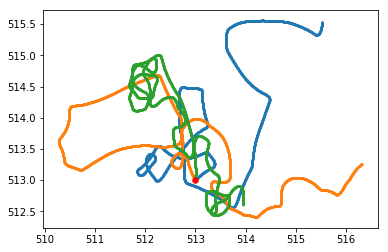

In [58]:
#plt.scatter(dfs[0].trajectory__pPos_x,dfs[0].trajectory__pPos_y,s=3,alpha=0.5)
#plt.scatter(dfs[1].trajectory__pPos_x,dfs[1].trajectory__pPos_y,s=3,alpha=0.5)
ind=3
plt.scatter(dfs[ind].trajectory__pPos_x[:2500],dfs[ind].trajectory__pPos_y[:2500],s=3,alpha=0.5)
plt.scatter(dfs[ind].trajectory__pPos_x[2500:5000],dfs[ind].trajectory__pPos_y[2500:5000],s=3,alpha=0.5)
plt.scatter(dfs[ind].trajectory__pPos_x[5000:],dfs[ind].trajectory__pPos_y[5000:],s=3,alpha=0.5)
plt.scatter(dfs[ind].trajectory__pPos_x[0],dfs[ind].trajectory__pPos_y[0],s=30,label="start",c="red")

/home/lsr/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


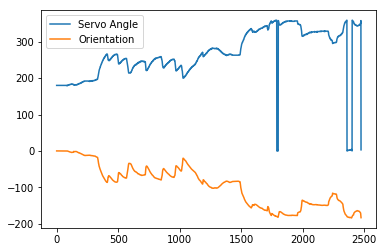

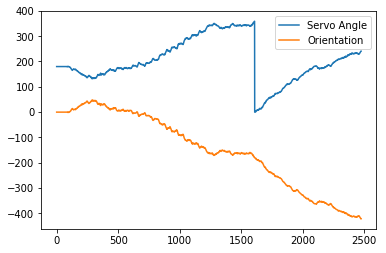

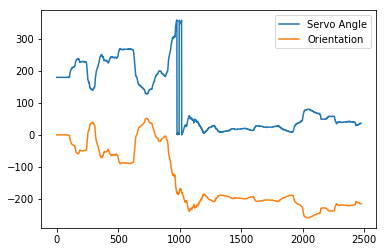

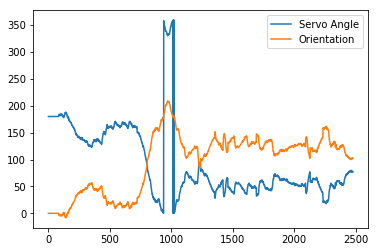

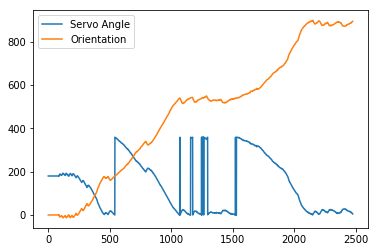

...

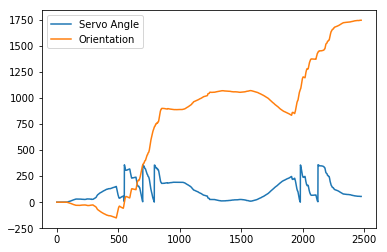

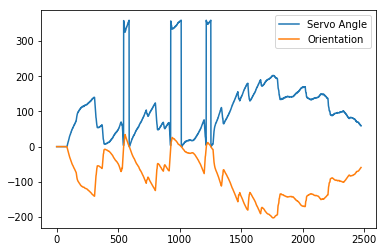

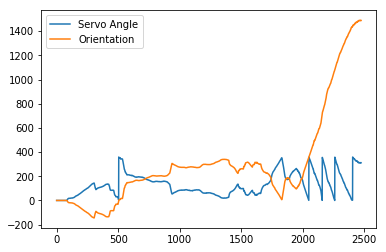

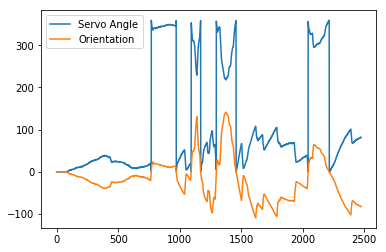

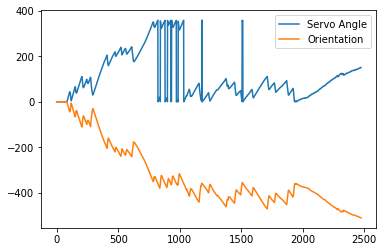

In [102]:
for trial in [2,3,4]:
    for ind in range(len(dfs)):
        plt.figure()
        #plt.subplot(4,1,1)
        plt.plot(dfs[ind].trajectory__servoAngle.values[dfs[ind].trajectory__trial==trial],label="Servo Angle")
        #plt.subplot(2,1,2)
        plt.plot(dfs[ind].trajectory__pOri_x.values[dfs[ind].trajectory__trial==trial],label="Orientation")
        #plt.subplot()
        plt.legend()

In [72]:
# case=1
# dec=30
# for ts in tsl[:20]:
#     df2=df[(df.timeStamp==ts)&(df.trajectory__case==case)&(df.windPressure.astype(float)>2.4)].ix[::dec]
#     plt.figure()
#     plt.scatter(df2.trajectory__pPos_x,df2.trajectory__pPos_y,s=3,alpha=0.3)
#     plt.xlim(500,526)
#     plt.ylim(500,526)    

In [12]:
angDeg=ang*180/np.pi

In [13]:
df.trajectory__pOri_x.values

array([   0.        ,    0.        ,    0.        , ..., -531.25164795,
       -534.19464111, -537.04266357])

In [79]:
# for nm,grp in groups:
#     plt.figure()
#     plt.plot(grp["trajectory__pPos_x"].values,grp["trajectory__pPos_y"].values)

In [16]:
np.arctan((np.tan(np.pi/2)))

1.5707963267948966

In [80]:
# for nm,grp in groups:
#     plt.figure()
#     plt.plot(np.arctan(grp["trajectory__pPos_y"].values/grp["trajectory__pPos_x"].values))

In [100]:
yy = [zzz[i].item() for i in range(len(zzz))]

In [93]:
str([1,2,233])

'[1, 2, 233]'

In [79]:

# for ts in tsl:
#     df2 = df[(df.timeStamp==ts)

df[(df.timeStamp==tsl[0])].trajectory__runNum.unique()

array([1., 2., 3., 4., 5., 6.])

In [76]:
tsl

array(['2018-01-17__14~38~15', '2018-01-24__17~19~46',
       '2018-01-17__14~43~47', '2018-01-24__17~29~08',
       '2018-01-17__14~58~16', '2018-01-24__17~39~42',
       '2018-01-24__20~45~24', '2018-01-17__17~54~40',
       '2018-01-24__19~47~36', '2018-01-24__20~54~18',
       '2018-01-17__18~12~12', '2018-01-24__20~00~59',
       '2018-01-17__18~19~48', '2018-01-24__20~20~12',
       '2018-01-24__20~27~48', '2018-01-24__20~36~56',
       '2018-01-17__18~39~31', '2018-01-17__18~54~11',
       '2018-01-17__19~01~14', '2018-01-17__19~07~48',
       '2018-01-17__19~14~52', '2018-01-17__19~27~06',
       '2018-01-17__19~33~19', '2018-01-17__19~40~05',
       '2018-01-17__19~47~21', '2018-01-17__19~54~53',
       '2018-01-17__20~04~03', '2018-01-17__20~13~09',
       '2018-01-17__12~01~29', '2018-01-17__12~06~58',
       '2018-01-17__12~12~40', '2018-01-17__12~21~48',
       '2018-01-17__12~27~21', '2018-01-17__12~32~54',
       '2018-03-30__14~09~27', '2018-03-30__14~13~06',
       '20

In [83]:
lst=np.array([1,2,2,2,23,2,1,2,3,3,7,3,3,5])
l=lambda wind_pre: lst == wind_pre

In [88]:
def my_jugad_func(wind,lmb = lambda wind:lst>3) :
    if(lmb(wind).any()):
        print(lmb(wind))

In [91]:
my_jugad_func(3,l)

[False False False False False False False False  True  True False  True
  True False]


In [92]:
def data_querry(fileName,
                wind_pressure,
                case,
                wind_condition = lambda wind_pressure: df.windPressure.astype(float)>wind_pressure, # might be bad way to pass condtional argument,
                visual = "grassSky", # this argument could be 'grassSky' or 'null' 
               ):
    return df[(df.timeStamp==fileName)&
              (wind_condition(wind_pressure))&
              (df.visual ==visual) & 
              df.trajectory__case == case ]

In [106]:
for ts in tsl:
    print(ts,"--->",df[(df.timeStamp == ts)].windPressure.unique())

2018-01-17__14~38~15 ---> ['0.']
2018-01-24__17~19~46 ---> ['0.']
2018-01-17__14~43~47 ---> ['0.5']
2018-01-24__17~29~08 ---> ['0.5']
2018-01-17__14~58~16 ---> ['1.']
2018-01-24__17~39~42 ---> ['1.']
2018-01-24__20~45~24 ---> ['1.']
2018-01-17__17~54~40 ---> ['1.5']
2018-01-24__19~47~36 ---> ['1.5']
2018-01-24__20~54~18 ---> ['1.5']
2018-01-17__18~12~12 ---> ['2.']
2018-01-24__20~00~59 ---> ['2.']
2018-01-17__18~19~48 ---> ['2.5']
2018-01-24__20~20~12 ---> ['2.5']
2018-01-24__20~27~48 ---> ['3.']
2018-01-24__20~36~56 ---> ['3.5']
2018-01-17__18~39~31 ---> ['0.']
2018-01-17__18~54~11 ---> ['0.5']
2018-01-17__19~01~14 ---> ['1.']
2018-01-17__19~07~48 ---> ['1.5']
2018-01-17__19~14~52 ---> ['2.']
2018-01-17__19~27~06 ---> ['2.5']
2018-01-17__19~33~19 ---> ['2.5']
2018-01-17__19~40~05 ---> ['3.']
2018-01-17__19~47~21 ---> ['3.5']
2018-01-17__19~54~53 ---> ['4.']
2018-01-17__20~04~03 ---> ['4.5']
2018-01-17__20~13~09 ---> ['4.8']
2018-01-17__12~01~29 ---> ['0.']
2018-01-17__12~06~58 ---> ['

In [107]:
df.columns

Index(['trajectory__DCoffset', 'trajectory__case', 'trajectory__groundSpeed',
       'trajectory__headingControl', 'trajectory__isFlying',
       'trajectory__pOri_x', 'trajectory__pPos_x', 'trajectory__pPos_y',
       'trajectory__pPos_z', 'trajectory__reset', 'trajectory__runNum',
       'trajectory__servoAngle', 'trajectory__slip', 'trajectory__speed',
       'trajectory__trial', 'trajectory__wbad', 'trajectory__wbas',
       'windPressure', 'visual', 'flowSource', 'timeStamp', 'r', 'theta'],
      dtype='object')

In [114]:
df.trajectory__groundSpeed.unique().shape

(1362,)

In [113]:
df.trajectory__headingControl.unique().shape

(2,)

In [111]:
df.trajectory__slip.unique().shape

(3570,)

In [112]:
df.shape

(2823474, 23)

In [115]:
df.trajectory__speed.unique()

array([0., 1.])

In [116]:
df.flowSource.unique()

array(['direct', 'valve'], dtype=object)